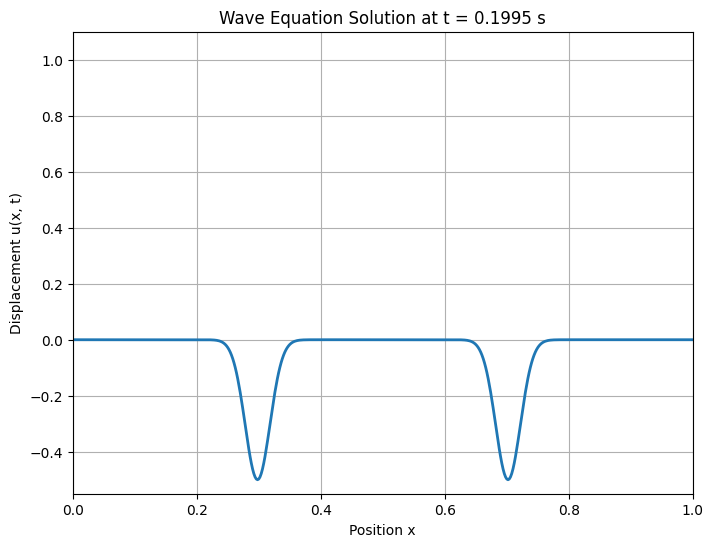

In [12]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Wave equation parameters
c = 4.0       # Wave speed
L = 1.0       # Length of the domain [0, L]

# Numerical parameters
N = 500       # Number of spatial divisions (increase N for higher resolution)
dx = L / N    # Spatial step size
x = np.linspace(0, L, N+1)  # Spatial grid

# Time parameters
dt = 0.0005    # Time step size
T = 1.0        # Total simulation time
nt = int(T / dt)  # Number of time steps
nt = 400

# Initial condition: Sharp peak (Gaussian function)
A = 1.0       # Amplitude of the peak
x0 = 0.5      # Center of the peak
sigma = 0.02  # Width of the peak (smaller value for a sharper peak)

u0 = A * np.exp(-((x - x0) ** 2) / (2 * sigma ** 2))

# Initial velocity: Zero everywhere
v0 = np.zeros(N+1)

# Initialize displacement arrays
u = np.zeros((nt+1, N+1))  # u[n, i] represents u at time step n and position x_i
u[0, :] = u0  # Set initial displacement

# First time step (n=1) using initial conditions
# For n=1, we need to compute u[1, :] based on u[0, :] and initial velocity
# Assuming initial velocity is zero, and using a Taylor expansion

# Compute the ratio (c * dt / dx)^2
r = (c * dt / dx) ** 2

# Update for the first time step
for i in range(1, N):
    u[1, i] = u[0, i] + 0.5 * r * (u[0, i+1] - 2 * u[0, i] + u[0, i-1])

# Apply boundary conditions at the first time step
u[1, 0] = 0.0  # Left boundary (fixed)
u[1, N] = 0.0  # Right boundary (fixed)

# Time-stepping loop
for n in range(1, nt):
    for i in range(1, N):
        u[n+1, i] = 2 * u[n, i] - u[n-1, i] + r * (u[n, i+1] - 2 * u[n, i] + u[n, i-1])
    # Apply boundary conditions
    u[n+1, 0] = 0.0  # Left boundary (fixed)
    u[n+1, N] = 0.0  # Right boundary (fixed)

# Compute the global minimum and maximum displacement values for setting y-axis limits
u_min = np.min(u)
u_max = np.max(u)

# Visualization
fig, ax = plt.subplots(figsize=(8, 6))
line, = ax.plot([], [], lw=2)
ax.set_xlim(0, L)
ax.set_ylim(u_min * 1.1, u_max * 1.1)  # Extend limits slightly for better view
ax.set_xlabel('Position x')
ax.set_ylabel('Displacement u(x, t)')
ax.set_title('Wave Equation Solution')
ax.grid(True)

def init():
    line.set_data([], [])
    return line,

def animate(n):
    line.set_data(x, u[n, :])
    ax.set_title(f"Wave Equation Solution at t = {n * dt:.4f} s")
    return line,

anim = FuncAnimation(fig, animate, frames=nt, init_func=init, interval=20, blit=True)

# Display the animation in the notebook
HTML(anim.to_jshtml())
